## Андриянов Павел Б22Д327

В этой работе мы будем анализировать датасет с грибами.

### Mushroom Dataset (Binary Classification)

[Kaggle](https://www.kaggle.com/datasets/prishasawhney/mushroom-dataset/data "Оригинальный датасет")

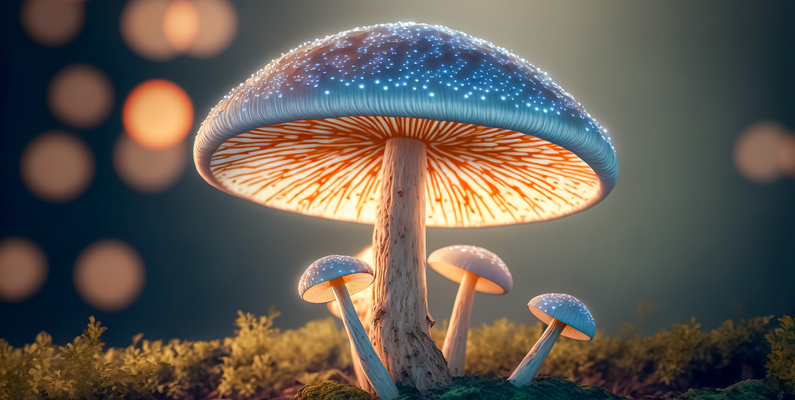

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

Загрузим наш датасет с грибами. Его часто используют для тестирования алгоритмов бинарной классификации, т. к. последний столбец датасета показывает, является гриб ядовитым (1) или съедобным (0).

In [7]:
df = pd.read_csv('https://raw.githubusercontent.com/BasedGitter/Mushroom-Dataset-Analysis/main/mushroom_dataset.csv', sep = ',')

Выведем первые и последние 5 записей датафрейма.

In [8]:
df.head()

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
0,1372,2,2,10,3.807467,1545,11,1.804273,1
1,1461,2,2,10,3.807467,1557,11,1.804273,1
2,1371,2,2,10,3.612496,1566,11,1.804273,1
3,1261,6,2,10,3.787572,1566,11,1.804273,1
4,1305,6,2,10,3.711971,1464,11,0.943195,1


In [9]:
df.tail()

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
54030,73,5,3,2,0.887740,569,12,0.943195,1
54031,82,2,3,2,1.186164,490,12,0.943195,1
54032,82,5,3,2,0.915593,584,12,0.888450,1
54033,79,2,3,2,1.034963,491,12,0.888450,1
54034,72,5,3,2,1.158311,492,12,0.888450,1


In [10]:
df.shape

(54035, 9)

Датасет имеет 9 столбцов и 54035 записей

In [11]:
df["cap-diameter"].value_counts()

273     93
269     91
104     88
242     86
280     85
        ..
1694     1
1826     1
1766     1
1865     1
1885     1
Name: cap-diameter, Length: 1847, dtype: int64

Выведем основные статистики по данным.

In [12]:
df.describe()

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
count,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000
mean,567.257204,4.000315,2.142056,7.329509,0.759110,1051.081299,8.418062,0.952163,0.549181
std,359.883763,2.160505,2.228821,3.200266,0.650969,782.056076,3.262078,0.305594,0.497580
min,0.000000,0.000000,0.000000,0.000000,0.000426,0.000000,0.000000,0.027372,0.000000
25%,289.000000,2.000000,0.000000,5.000000,0.270997,421.000000,6.000000,0.888450,0.000000
50%,525.000000,5.000000,1.000000,8.000000,0.593295,923.000000,11.000000,0.943195,1.000000
75%,781.000000,6.000000,4.000000,10.000000,1.054858,1523.000000,11.000000,0.943195,1.000000
max,1891.000000,6.000000,6.000000,11.000000,3.835320,3569.000000,12.000000,1.804273,1.000000


Полезно будет также сразу взглянуть на типы данных в датафрейме.

In [13]:
df.dtypes

cap-diameter         int64
cap-shape            int64
gill-attachment      int64
gill-color           int64
stem-height        float64
stem-width           int64
stem-color           int64
season             float64
class                int64
dtype: object

Заметим, что все последовательности соответствуют числовому типу данных, что свидетельствует об отсутствии категориальных переменных, поэтому их не нужно будет кодировать при анализе.

Проверим, есть ли пропуски в данных.

In [14]:
df.isna().sum()

cap-diameter       0
cap-shape          0
gill-attachment    0
gill-color         0
stem-height        0
stem-width         0
stem-color         0
season             0
class              0
dtype: int64

Пропусков нет, поэтому нет необходимости обрабатывать эти ситуации. В случае наличия мы бы удаляли строки с пустыми значениями либо могли бы воспользоваться заполнением данных, помеченными как "NAN", например, средними значениями по столбцу датафрейма.

Выведем, сколько уникальных значений содержится в каждом столбце.

In [15]:
unique_values_count = []
for col in df:
    unique_values_count.append(df[col].unique().size)
df1 = pd.DataFrame({"Column" : list(df.columns), "Unique_count" : unique_values_count})
df1

,Column,Unique_count
0,cap-diameter,1847
1,cap-shape,7
2,gill-attachment,7
3,gill-color,12
4,stem-height,1455
5,stem-width,3510
6,stem-color,13
7,season,4
8,class,2


В дальнейшем могут возникнуть проблемы при обработке дефиса в названиях столбцов датафрейма, поэтому заменим его символом *underscore* "**_**"

In [16]:
df.columns = df.columns.str.replace("-", "_", regex=True)

In [17]:
df.head(2)

,cap_diameter,cap_shape,gill_attachment,gill_color,stem_height,stem_width,stem_color,season,class
0,1372,2,2,10,3.807467,1545,11,1.804273,1
1,1461,2,2,10,3.807467,1557,11,1.804273,1


Исходя из полученной выше информации сделаем некоторые первые выводы о данных:
>Столбцы *cap_shape, gill_attachment, gill_color, stem_color, season* хотя и относятся к количественным переменным, измеряемым в относительной шкале, на самом деле раньше были качественными переменными, которые должны измеряться в номинальной шкале.\
>Столбцы *cap_diameter, stem_height, stem_width* являются относительными количественными переменными.\
>Столбец *class* - номинальная бинарная.

Опишем данные таблицей.

In [18]:
ddf = pd.DataFrame({"Характеристика объекта": ["Диаметр шляпки", "Форма шляпки", "Жаберное крепление",
                                              "Цвет ламеллы", "Высота ножки", "Ширина ножки", "Цвет стебля", "Время года", "Ядовитость"],
                   "Название переменной":list(df.columns),
                   "Шкала измерения":["Относительная", "Номинальная", "Номинальная", "Номинальная",
                                      "Относительная", "Относительная", "Номинальная","Номинальная", "Бинарная"],
                   "Тип переменной":["Количественная", "Качественная", "Качественная",
                                     "Качественная", "Количественная", "Количественная", "Качественная",
                                     "Качественная", "Качественная"],
                    "Уникальные значения": unique_values_count
                   })
ddf.index = ddf.index + 1

In [19]:
ddf

,Характеристика объекта,Название переменной,Шкала измерения,Тип переменной,Уникальные значения
1,Диаметр шляпки,cap_diameter,Относительная,Количественная,1847
2,Форма шляпки,cap_shape,Номинальная,Качественная,7
3,Жаберное крепление,gill_attachment,Номинальная,Качественная,7
4,Цвет ламеллы,gill_color,Номинальная,Качественная,12
5,Высота ножки,stem_height,Относительная,Количественная,1455
6,Ширина ножки,stem_width,Относительная,Количественная,3510
7,Цвет стебля,stem_color,Номинальная,Качественная,13
8,Время года,season,Номинальная,Качественная,4
9,Ядовитость,class,Бинарная,Качественная,2


Вывод некоторых показателей, таких как минимальное и максимальное значения, среднее и медиана о количественных переменных в зависимости от принадлежности к классу, будет полезным. На практике эта информация поможет сразу определить числовые характеристики, которые соответствуют определенному классу.

In [20]:
metrics = ['min', 'max', 'mean', 'median']
df.groupby('class').agg({'cap_diameter' : metrics, 'stem_height' : metrics,
                        'stem_width' : metrics})

cap_diameter                          stem_height                     \
               min   max        mean median         min      max      mean   
class                                                                        
0                8  1891  633.064696  606.0    0.000426  3.83532  0.627374   
1                0  1890  513.236293  439.0    0.000426  3.83532  0.867251   

                stem_width                             
         median        min   max         mean  median  
class                                                  
0      0.473925         21  3569  1208.915189  1157.0  
1      0.720623          0  3568   921.516563   663.0

In [21]:
df["class"].value_counts()

1    29675
0    24360
Name: class, dtype: int64

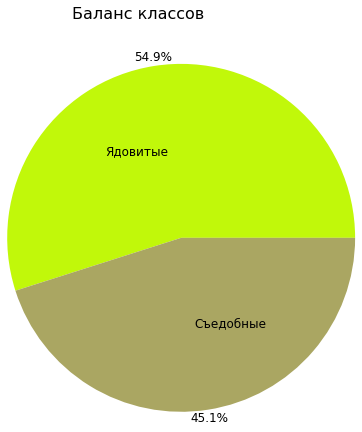

In [22]:
plt.figure(figsize=(4,4))
plt.pie(df["class"].value_counts(), labels=["Ядовитые", "Съедобные"], colors=['#C1F80A', '#AAA662'], radius=2,
       autopct='%1.1f%%', pctdistance=1.05, labeldistance=0.5, textprops={'fontsize': 12})
plt.title(
    label="Баланс классов", 
    fontdict={"fontsize":16},
    pad=110,
    loc='left'
)
plt.show()

Из графика заметим, что в датасете преобладают ядовитые грибы. Их на $\approx 10\%$ больше, чем съедобных.

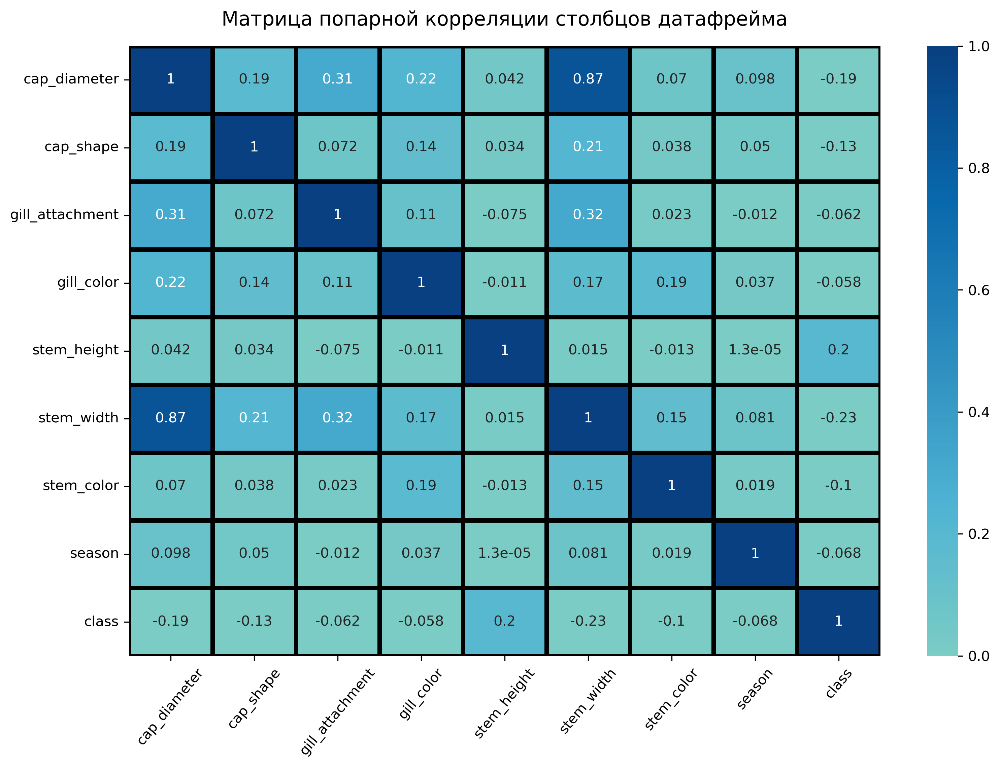

In [23]:
fig, ax = plt.subplots(figsize = (12, 8), dpi=300)
ax = sns.heatmap(df.corr(method='spearman'), vmin=0, vmax=1, center= 0,
                 cmap= 'GnBu', linewidths=3, linecolor='black', annot = True)
plt.title("Матрица попарной корреляции столбцов датафрейма", y=1.02, fontsize=14)
plt.xticks(rotation=50, ha='center')
plt.savefig("correlation.jpg", format="jpg", dpi=600)
plt.show()

График выше является матрицей попарной корреляции столбцов с данными. Для вычисления корреляционного коэффициента применяется критерий корреляции Спирмена. Он лучше всего подходит для описания данных, представленных в числовом формате.\
Напомним, что в качестве целевой переменной определяется ядовитость гриба. Из матрицы видно, что самая сильная отрицательная корреляция наблюдается между шириной ножки и ядовитостью. А вот высота ножки, наоборот, оказывает наибольшее положительное влияние на целевую переменную. Данная информация может быть полезна при отборе признаковых переменных, участвующих в анализе.\
P. S. Матрица позволяет установить и другие попарные зависимости, однако при решении задачи мы будем пользоваться этим в меньшей степени.

In [24]:
df.season.unique()

array([1.80427271, 0.94319455, 0.88845029, 0.02737213])

Информация о времени года, к сожалению, закодирована, поэтому мы лишь можем предположить, какое время года имелось в виду. Поскольку мы не имеем информации о названиях грибов, не составляется возможным точно сопоставить времена года с их числовыми значениями. Здесь и далее будем представлять эту информацию в виде некоторой абстракции, помня, что закодированы качественные переменные.

Рассмотрим сравнительное количество съедобных и ядовитых грибов в зависимости от времени года.

In [25]:
poisonous, edible = '#C79FEF', '#AAA662'

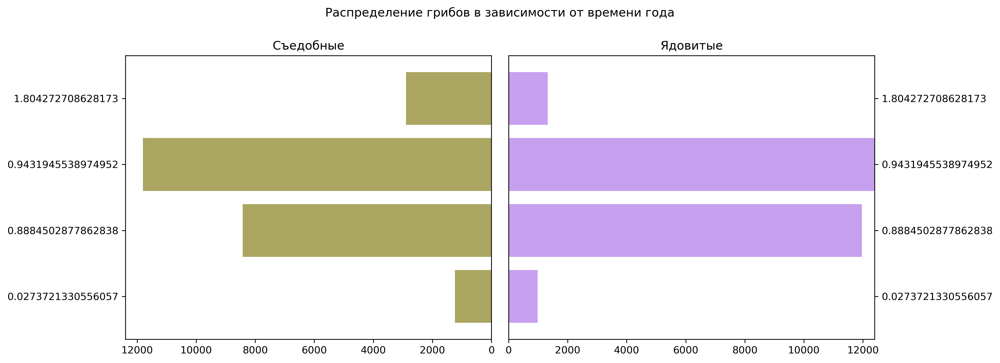

In [26]:
fig, ax = plt.subplots(1, 2, figsize = (14, 5), dpi=300)
fig.suptitle('Распределение грибов в зависимости от времени года', y = 1, fontsize = 12)
left = df.groupby(['class', 'season']).size()[0]
right = df.groupby(['class', 'season']).size()[1]

left.plot.barh(left, width = 0.8, color = edible, ax = ax[0])
ax[0].yaxis.tick_left()
ax[0].set_title('Съедобные')
ax[0].set_ylabel('')
ax[0].set_xlim(ax[0].get_xlim()[::-1])

right.plot.barh(right, color = poisonous, width = 0.8, ax = ax[1])
ax[1].yaxis.tick_right()
ax[1].set_title('Ядовитые')
ax[1].set_ylabel('')
ax[1].set_xlim(ax[0].get_xlim()[::-1])
fig.tight_layout()
plt.savefig("seasons.jpg", format="jpg", dpi=600)

Предположим, что значения, расположенные в порядке возрастания значения, соответствуют сезонам "зима", "лето", "осень", "весна" соответственно. Тогда исходя из графика можно сделать вывод о том, что осенью встречается больше всего грибов, причем как съедобных, так и ядовитых. Летом количество грибов несколько меньше, но больше ядовитых. Найденный весной гриб с большей вероятностью окажется съедобным, а гриб, срезанный зимой, может оказаться ядовитым или съедобным примерно в равных пропорциях.

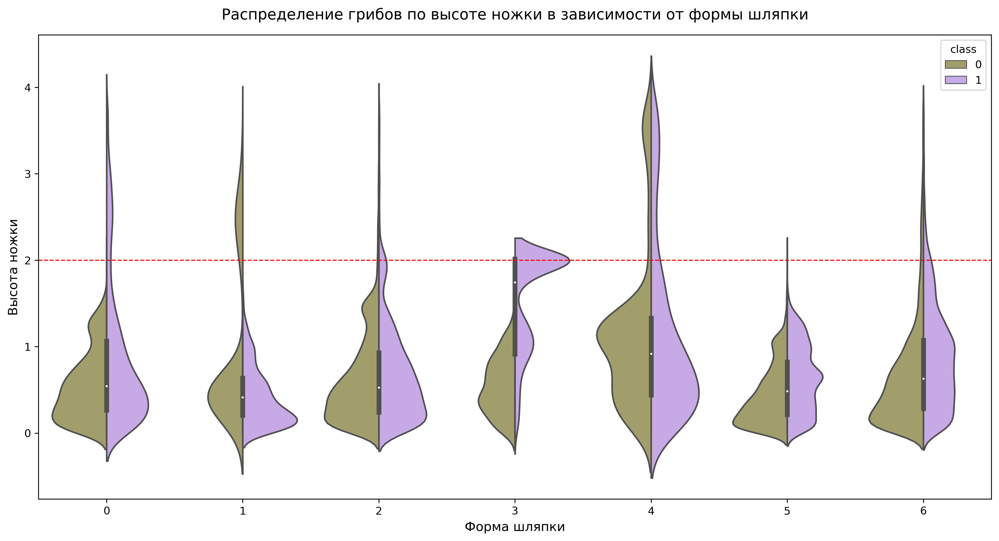

In [27]:
fig, ax = plt.subplots(dpi=300)
sns.violinplot(x = 'cap_shape', y = 'stem_height', hue = 'class', split = True,
               palette = [edible, poisonous], n_colors = 2, data = df, ax = ax).set_title('Распределение грибов по высоте ножки в зависимости от формы шляпки',
                                                                                          y = 1.02, fontsize=14)
ax.figure.set_figwidth(16)
ax.figure.set_figheight(8)
ax.set_xlabel("Форма шляпки", fontsize=12)
ax.set_ylabel("Высота ножки", fontsize=12)
plt.axhline(y=2, linewidth=1, color='r', linestyle='dashed')
plt.savefig("capShape_stemHeight.jpg", format="jpg", dpi=600)
plt.show()

In [28]:
df.stem_height.min()

0.0004256969608359

График показывает, что, в общем и целом, большая часть грибов имеет высоту ножки от 0 до 2 условных единиц. Если вы встретите гриб с формой шляпки "3" и высотой ножки 2 у. е., то это с большей вероятностью ядовитый гриб. С грибами, которые имеют форму шляпки "0" или "4" также нужно быть внимательными, т. к. для них большая доля встретить ядовитый экземпляр. Грибы с формой шляпки "0" и высотой ножки $>1.75$ у. е. лучше не собирать $-$ они ядовиты.

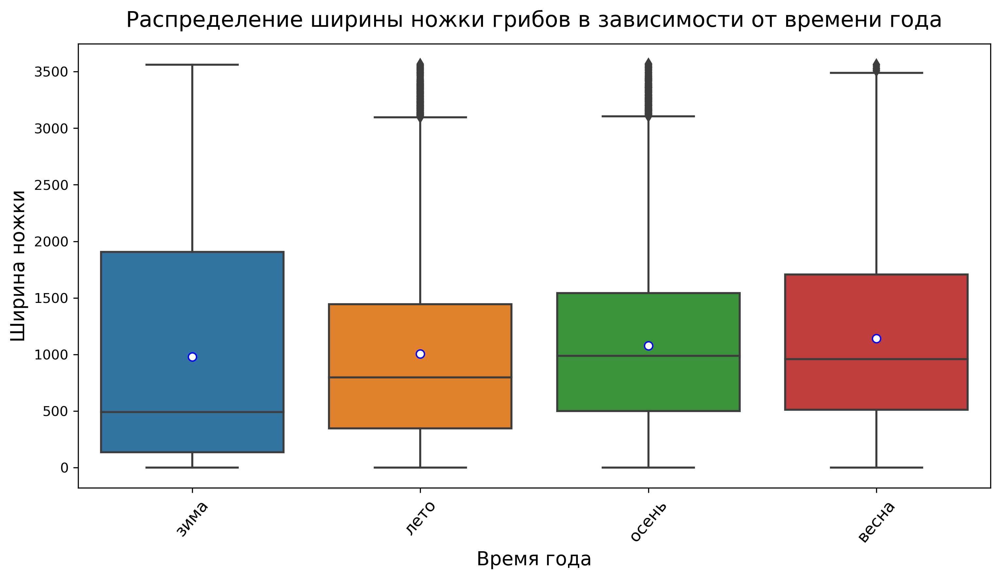

In [29]:
fig, ax = plt.subplots(figsize=(12,6), dpi=300)
ax = sns.boxplot(ax=ax, data=df.sort_values(by='season'), x='season', y='stem_width', showmeans=True,
            meanprops={"marker":"o","markerfacecolor":"white", 
            "markeredgecolor":"blue"}, order=sorted(df['season'].unique()))
plt.xticks(rotation=50, ha='center', fontsize=12)
ax.set_xticklabels(["зима", "лето", "осень", "весна"])
plt.xlabel("Время года", fontsize=14)
plt.ylabel("Ширина ножки", fontsize=14)
plt.title("Распределение ширины ножки грибов в зависимости от времени года", y=1.02, fontsize=16)
plt.savefig("season_stemWidth.jpg", format="jpg", dpi=600)
plt.show()

Диаграммы Бокса-Уискера, изображенные выше, показывают распределение данных. Сам "box" содержит данные, которые еще называют IQR, иначе говоря это данные расположенные между первым и третьим квартилями.\
При интерпретации будем использовать соотнесение числовых значений с временами года, которые мы приводили выше. Заметим, что медианное значение ширины ножки у зимних грибов меньше, чем у грибов, встречающихся в другое время года. В то же время "зимние" грибы имеют более широкий диапазон встречаемости различной ширины ножки.\
В целом, грибы, которые встречаются, весной, летом и осенью, имеют примерно одинаковое распределение касательно ширины ножки, в среднем это значение составляет 1000 у. е. Также в эти сезоны могут встретиться грибы с шириной ножки более 3000 у. е. Таких экземпляров не так много. На диаграмме они показаны черными ромбами, что означает выбросы в данных.

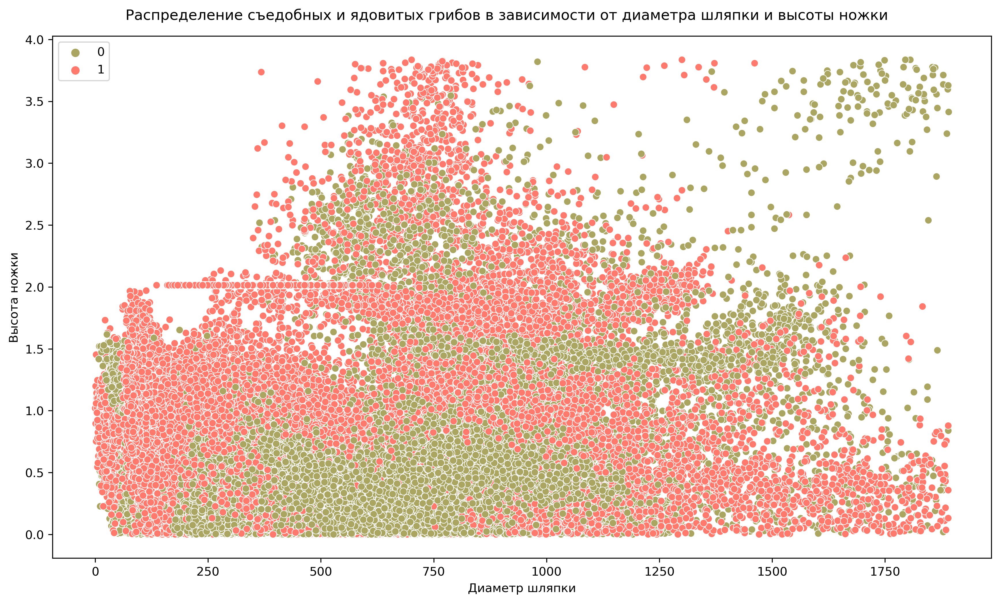

In [30]:
fig, ax = plt.subplots(dpi=300)
fig.suptitle('Распределение съедобных и ядовитых грибов в зависимости от диаметра шляпки и высоты ножки', y = 0.92, fontsize = 12)
ax = sns.scatterplot(x = 'cap_diameter', y = 'stem_height', hue = 'class', data = df, palette = [edible, '#FF796C'])
ax.set_xlabel('Диаметр шляпки')
ax.set_ylabel('Высота ножки')
ax.figure.set_figwidth(14)
ax.figure.set_figheight(8)
ax.legend()
plt.savefig("capDiameter_stemHeight.jpg", format="jpg", dpi=600)
plt.show()

Диаграмма выше позволяет понять, что съедобные грибы чаще всего имеют диаметр шляпки от 300 до 1000 у. е. и высоту ножки от чуть более нуля до 1 у. е. Также если мы найдем гриб с диаметром шляпки $>1500$ у. е. и высотой ножки $>2.5$ у. е., то это будет съедобный гриб.\
В общем и целом, диаграмма рассеяния позволяет посмотреть, как распределены целевые характеристики в зависимости от двух объясняющих переменных. Применительно к нашей задаче, мы смотрим на распределение ядовитых и съедобных грибов при изменении диаметра шляпки и высоты ножки.

In [31]:
dfm = df.groupby(['class', 'stem_color']).size().to_frame().rename(columns={0: "Кол-во вхождений"})

In [32]:
dfm

Кол-во вхождений
class stem_color                  
0     0                        173
      1                        538
      3                       1594
      5                        105
      6                       5776
      7                        858
      8                        132
      9                        114
      10                       533
      11                     12043
      12                      2494
1     1                       1380
      2                       1059
      3                       1032
      4                        576
      5                        121
      6                       9540
      7                        990
      8                        893
      9                        427
      10                       860
      11                      8274
      12                      4523

Представим таблицу выше в виде Sankey-диаграммы.

In [33]:
# для лучшей интерпретации заменим значения принадлежности к классу на строковые переменные
def changing(numb):
    if numb == 1:
        return 'ядовитый'
    else:
        return 'съедобный'

In [34]:
df_t = df[['class', 'stem_color']]
df_t = df_t.copy()

In [35]:
df_t.loc[:, 'class'] = df_t['class'].apply(lambda x: changing(x))

Некоторые значения отсутствовали (их сумма равнялась нулю). Это может вызвать проблемы, т. к. в матрице будут отсутствовать значения. По этой причине заполним датафрейм недостающими нулями.

In [36]:
dfg = df_t.groupby(['class', 'stem_color']).size().unstack(fill_value=0).stack()

In [37]:
# импорт библиотеки для отрисовки Sankey Diagram
import plotly.graph_objects as go

In [38]:
# матрица размерности 13x2
m = dfg.to_numpy().reshape(13, 2)
stem_color_lst = sorted(df['stem_color'].unique())
class_lst = sorted(df_t['class'].unique())

In [39]:
# функция отрисовки Sankey Diagram
def sankey(cat1, cat2, m, treshold=0, h1=[], h2=[]):
    all_nodes = cat1 + cat2
    source_indices = list(range(len(cat1)))
    target_indices = list(range(len(cat1),len(cat1)+len(cat2)))
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
              '#bcbd22', '#17becf', "blue", "black", "green", edible, '#C1F80A']
    s, t, v, c = [], [], [], []
    for i in range(len(cat1)):
        for j in range(len(cat2)):
            if m[i,j]>treshold:
                s.append(i)
                t.append(len(cat1)+j)
                v.append(m[i,j])
                c.append('lightgray' if i in h1 or j in h2 else 'pink')

    fig = go.Figure(data=[go.Sankey(
        valueformat = ".0f",
        valuesuffix = "TWh",
        # Define nodes
        node = dict(
        pad = 29,
        thickness = 40,
        line = dict(color = "purple", width = 0.4),
        label =  all_nodes,
        color = colors
        ),

        # Add links
        link = dict(
        source =  s,
        target =  t,
        value =  v,
        color = c
    ))])
    
    fig.update_layout(title_text="Sankey-диаграмма взаимосвязи цвета стебля и съедобности грибов", font_size=12)
    fig.show(dpi=600)
    
    return fig

In [40]:
diagram = sankey(stem_color_lst, class_lst, m, 100, h2=[0])
diagram.write_html('sankey.html', auto_open=True)

Изображенная выше диаграмма Sankey позволяет оценить взаимосвязь бинарной переменной с цветом стебля гриба. Благодаря ей можно выделить экземпляры, цвет стебля которых явно намекает на то, что гриб является ядовитым. Заметим, что ядовитые грибы имеют чаще всего цвет стебля "5" или "9".